In [1]:
### Installation info
# conda create -n detectron_env python=3.8
# conda activate detectron_env
# conda install cython
# conda install pytorch torchvision torchaudio pytorch-cuda=12.1 -c pytorch -c nvidia
# git clone https://github.com/facebookresearch/detectron2.git
# cd detectron2
# conda install -e .
# conda install opencv-python

In [2]:
### Virtual environment and notebook init
# Call conda activate detectron_env
# cd C:\R_projects\deep_learning_playground
# Call jupyter lab

In [3]:
### Check working directory
# pwd
### Check if entered correct environment
# conda info --envs

In [4]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Fri_Sep__8_19:56:38_Pacific_Daylight_Time_2023
Cuda compilation tools, release 12.3, V12.3.52
Build cuda_12.3.r12.3/compiler.33281558_0
torch:  2.1 ; cuda:  2.1.1
detectron2: 0.6


In [5]:
# Some basic setup:
# Setup detectron2 logger
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor,DefaultTrainer
from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.utils.visualizer import ColorMode,GenericMask,Visualizer
from detectron2.structures.keypoints import heatmaps_to_keypoints
from detectron2.structures.keypoints_hack import heatmaps_to_keypoints2, heatmaps_to_keypoints_iterative, heatmaps_modify_iterative
from matplotlib import pyplot as plt
import glob
import random
from detectron2.data import build_detection_test_loader
from detectron2.evaluation import (
    CityscapesInstanceEvaluator,
    CityscapesSemSegEvaluator,
    COCOEvaluator,
    COCOPanopticEvaluator,
    LVISEvaluator,
    PascalVOCDetectionEvaluator,
    SemSegEvaluator,
    DatasetEvaluator,
    inference_on_dataset,
    print_csv_format,
    verify_results,
)
import cv2 

In [6]:
cd C:\R_projects\deep_learning_playground\detectron2\custom_data2

C:\R_projects\deep_learning_playground\detectron2\custom_data2


In [7]:
# Split training and test data
#!coco-split --has_annotations --valid_ratio 0 --test_ratio 0.1 --annotations_file ./caterpillar_12_09_2023_with_keypoints.json

In [8]:
from detectron2.engine.hooks import HookBase
from detectron2.evaluation import inference_context
from detectron2.utils.logger import log_every_n_seconds
from detectron2.data import DatasetMapper, build_detection_test_loader
import detectron2.utils.comm as comm
import torch
import time
import datetime
import logging

class LossEvalHook(HookBase):
    def __init__(self, eval_period, model, data_loader):
        self._model = model
        self._period = eval_period
        self._data_loader = data_loader
    
    def _do_loss_eval(self):
        # Copying inference_on_dataset from evaluator.py
        total = len(self._data_loader)
        num_warmup = min(5, total - 1)
            
        start_time = time.perf_counter()
        total_compute_time = 0
        losses = []
        for idx, inputs in enumerate(self._data_loader):            
            if idx == num_warmup:
                start_time = time.perf_counter()
                total_compute_time = 0
            start_compute_time = time.perf_counter()
            if torch.cuda.is_available():
                torch.cuda.synchronize()
            total_compute_time += time.perf_counter() - start_compute_time
            iters_after_start = idx + 1 - num_warmup * int(idx >= num_warmup)
            seconds_per_img = total_compute_time / iters_after_start
            if idx >= num_warmup * 2 or seconds_per_img > 5:
                total_seconds_per_img = (time.perf_counter() - start_time) / iters_after_start
                eta = datetime.timedelta(seconds=int(total_seconds_per_img * (total - idx - 1)))
                log_every_n_seconds(
                    logging.INFO,
                    "Loss on Validation  done {}/{}. {:.4f} s / img. ETA={}".format(
                        idx + 1, total, seconds_per_img, str(eta)
                    ),
                    n=5,
                )
            loss_batch = self._get_loss(inputs)
            losses.append(loss_batch)
        mean_loss = np.mean(losses)
        self.trainer.storage.put_scalar('validation_loss', mean_loss)
        comm.synchronize()

        return losses
            
    def _get_loss(self, data):
        # How loss is calculated on train_loop 
        metrics_dict = self._model(data)
        metrics_dict = {
            k: v.detach().cpu().item() if isinstance(v, torch.Tensor) else float(v)
            for k, v in metrics_dict.items()
        }
        total_losses_reduced = sum(loss for loss in metrics_dict.values())
        return total_losses_reduced
        
        
    def after_step(self):
        next_iter = self.trainer.iter + 1
        is_final = next_iter == self.trainer.max_iter
        if is_final or (self._period > 0 and next_iter % self._period == 0):
            self._do_loss_eval()
        self.trainer.storage.put_scalars(timetest=12)

from detectron2.data import DatasetMapper, build_detection_test_loader
from detectron2.engine import DefaultTrainer

class CustomTrainer(DefaultTrainer):
    """
    Custom Trainer deriving from the "DefaultTrainer"

    Overloads build_hooks to add a hook to calculate loss on the test set during training.
    """

    def build_hooks(self):
        hooks = super().build_hooks()
        hooks.insert(-1, LossEvalHook(
            200, # Frequency of calculation - every 100 iterations here
            self.model,
            build_detection_test_loader(
                self.cfg,
                self.cfg.DATASETS.TEST[0],
                DatasetMapper(self.cfg, True)
            )
        ))

        return hooks


In [9]:
register_coco_instances("cat_data_train", {}, ".\coco_train.json", ".\datasets\caterpillar")
register_coco_instances("cat_data_test", {}, ".\coco_test.json", ".\datasets\caterpillar")
#register_coco_instances("cat_data_val", {}, ".\valid.json", ".\datasets\caterpillar")
MetadataCatalog.get("cat_data_train").set(thing_classes=["cat"])
MetadataCatalog.get("cat_data_train").set(thing_colors=(0,0,255))
MetadataCatalog.get("cat_data_test").set(thing_classes=["cat"])
MetadataCatalog.get("cat_data_test").set(thing_colors=(0,0,255))
MetadataCatalog.get("cat_data_train").set(keypoint_names=["head","middle","tail"])
MetadataCatalog.get("cat_data_train").set(keypoint_flip_map=[])
MetadataCatalog.get("cat_data_test").set(keypoint_names=["head","middle","tail"])
MetadataCatalog.get("cat_data_test").set(keypoint_flip_map=[])

namespace(name='cat_data_test',
          json_file='.\\coco_test.json',
          image_root='.\\datasets\\caterpillar',
          evaluator_type='coco',
          thing_classes=['cat'],
          thing_colors=(0, 0, 255),
          keypoint_names=['head', 'middle', 'tail'],
          keypoint_flip_map=[])

In [104]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("cat_data_train",)
cfg.DATASETS.TEST = ("cat_data_test", )
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.DATALOADER.NUM_WORKERS = 2
cfg.TEST.EVAL_PERIOD = 200
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00015  
cfg.SOLVER.MAX_ITER = 20000    
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1 
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9
cfg.TEST.DETECTIONS_PER_IMAGE = 1
cfg.SOLVER.CHECKPOINT_PERIOD = 500
cfg.MODEL.ROI_KEYPOINT_HEAD.NUM_KEYPOINTS = 3
cfg.TEST.KEYPOINT_OKS_SIGMAS = [0.1, 0.3, 0.1]
cfg.INPUT.RANDOM_FLIP = "horizontal"
cfg.MODEL.MASK_ON = True
cfg.MODEL.KEYPOINT_ON = True
cfg.MODEL.ROI_KEYPOINT_HEAD.LOSS_WEIGHT = 5
cfg.MODEL.ROI_KEYPOINT_HEAD.NORMALIZE_LOSS_BY_VISIBLE_KEYPOINTS = False
#cfg.MODEL.ROI_KEYPOINT_HEAD.ITERATIVE = True       # currently does nothing because cfg not passed in function. 
#                                       Loss calculation does not include interative method, but keypoint prediction does
cfg.OUTPUT_DIR = "./output4"
cfg.INPUT.USE_DIFF = True                      # Include difference in green channel 10 frames ago as the 4th channel
cfg.INPUT.MIN_SIZE_TRAIN = (1000)
cfg.INPUT.MIN_SIZE_TEST = 1000
cfg.MODEL.PIXEL_MEAN = [103.530, 116.280, 123.675, 10]     # Need to set to list of len 3 if INPUT.USE_DIFF = False
cfg.MODEL.PIXEL_STD = [1.0, 1.0, 1.0, 2.0]                        # Need to set to list of len 3 if INPUT.USE_DIFF = False
cfg.MODEL.BACKBONE.FREEZE_AT = 0
cfg.MODEL.RETINANET.NUM_CLASSES = 1

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)


In [88]:
print(cfg)

CUDNN_BENCHMARK: False
DATALOADER:
  ASPECT_RATIO_GROUPING: True
  FILTER_EMPTY_ANNOTATIONS: True
  NUM_WORKERS: 2
  REPEAT_THRESHOLD: 0.0
  SAMPLER_TRAIN: TrainingSampler
DATASETS:
  PRECOMPUTED_PROPOSAL_TOPK_TEST: 1000
  PRECOMPUTED_PROPOSAL_TOPK_TRAIN: 2000
  PROPOSAL_FILES_TEST: ()
  PROPOSAL_FILES_TRAIN: ()
  TEST: ('cat_data_test',)
  TRAIN: ('cat_data_train',)
GLOBAL:
  HACK: 1.0
INPUT:
  CROP:
    ENABLED: False
    SIZE: [0.9, 0.9]
    TYPE: relative_range
  FORMAT: BGR
  MASK_FORMAT: polygon
  MAX_SIZE_TEST: 1333
  MAX_SIZE_TRAIN: 1333
  MIN_SIZE_TEST: 1000
  MIN_SIZE_TRAIN: 1000
  MIN_SIZE_TRAIN_SAMPLING: choice
  RANDOM_FLIP: horizontal
  USE_DIFF: True
MODEL:
  ANCHOR_GENERATOR:
    ANGLES: [[-90, 0, 90]]
    ASPECT_RATIOS: [[0.5, 1.0, 2.0]]
    NAME: DefaultAnchorGenerator
    OFFSET: 0.0
    SIZES: [[32], [64], [128], [256], [512]]
  BACKBONE:
    FREEZE_AT: 0
    NAME: build_resnet_fpn_backbone
  DEVICE: cuda
  FPN:
    FUSE_TYPE: sum
    IN_FEATURES: ['res2', 'res3', '

In [12]:
#val_loader = build_detection_test_loader(cfg, "cat_data_train")
#val_loader.dataset.__getitem__(1)
from detectron2.data import detection_utils

#dataset_dict = DatasetCatalog.get("cat_data_train")[1]
val_loader = build_detection_test_loader(cfg, "cat_data_train")
val_loader.dataset.__getitem__(1)["image"].shape
#img = detection_utils.read_image(dataset_dict["file_name"], format=cfg.INPUT.FORMAT)
#img_diff = detection_utils.read_image(dataset_dict["file_name"].replace(".jpg","_diff.jpg"), format=cfg.INPUT.FORMAT)
#np.concatenate((img, img_diff), axis = 2)[:,:,[0,1,2,4]].shape

[12/09 15:33:51 d2.data.datasets.coco]: Loaded 380 images in COCO format from .\coco_train.json
[12/09 15:33:51 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    cat     | 380          |
|            |              |
[12/09 15:33:51 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(1000, 1000), max_size=1333, sample_style='choice')]
[12/09 15:33:51 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[12/09 15:33:51 d2.data.common]: Serializing 380 elements to byte tensors and concatenating them all ...
[12/09 15:33:51 d2.data.common]: Serialized dataset takes 0.27 MiB


torch.Size([4, 1000, 1000])

In [105]:
#trainer = DefaultTrainer(cfg)
trainer = CustomTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[12/09 23:51:00 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          4, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

KeyboardInterrupt: 

In [106]:
%load_ext tensorboard
#%reload_ext tensorboard
%tensorboard --logdir "./output4"
# !del /S C:\Users\vsbpa\AppData\Local\Temp\.tensorboard-info

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 6700), started 3:47:12 ago. (Use '!kill 6700' to kill it.)

In [91]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_0009999.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9  # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[12/09 20:13:33 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output4\model_0009999.pth ...


In [108]:
%matplotlib inline 

# f = glob.glob("C:\R_projects\deep_learning_playground\detectron2\custom_data\coco_dataset\*.jpg")
f = glob.glob("C:/R_projects/spat_1f_noise/processed_feed/rep50/*.jpg")
# f = ["C:/R_projects/spat_1f_noise/processed_feed/repweek2test2/processed_repweek2test2__cam28_s36764_rank103.jpg"]
fi = random.choice(f)
#fi = f[0]
im = imread_diff(fi, cfg.INPUT.FORMAT)
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, 0:3][:,:,::-1],
                   metadata=MetadataCatalog.get("cat_data_train"), 
                   scale=1, 
               instance_mode=ColorMode.IMAGE_BW
)
#out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
try: out = v.draw_circle((outputs["instances"].pred_keypoints.tolist())[0][0][:2:], "red", radius = 5)
except: print("Head not detected") 
try: out = v.draw_circle((outputs["instances"].pred_keypoints.tolist())[0][1][:2:], "black")
except: print("Middle not detected") 
try: out = v.draw_circle((outputs["instances"].pred_keypoints.tolist())[0][2][:2:], "green")
except: print("Tail not detected") 
try: out = v.draw_soft_mask(np.asarray(outputs["instances"].to("cpu").pred_masks)[0,:,:], "blue",alpha = 0.3)
except: print("Mask not detected") 

plt.figure(figsize = (10,10))
plt.imshow(out.get_image()[:,:,0:3], interpolation='nearest')
plt.title(fi)
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\R_projects\\spat_1f_noise\\processed_feed\\rep50\\processed_rep50__cam19_s342405_rank951_diff.jpg'

In [ ]:
f = glob.glob("C:/R_projects/deep_learning_playground/test_data/rep15/*[!_diff].jpg")
tot = len(f)
for i in range(tot):
    fi = f[i]
    im = imread_diff(fi, cfg.INPUT.FORMAT)
    outputs = predictor(im) 
    v = Visualizer(im[:, :, 0:3][:,:,::-1],
                   metadata=MetadataCatalog.get("cat_data_train"), 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW
    )
    #out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    try: out = v.draw_box(outputs["instances"].pred_boxes.tensor.tolist()[0])
    except: out = v.draw_circle((0,0), radius = 0, color = "black")
    try: out = v.draw_circle((outputs["instances"].pred_keypoints.tolist())[0][0][:2:], color = "red", radius = 3)
    except: 1
    try: out = v.draw_circle((outputs["instances"].pred_keypoints.tolist())[0][1][:2:], color = "black", radius = 2)
    except: 1
    try: out = v.draw_circle((outputs["instances"].pred_keypoints.tolist())[0][2][:2:], color = "green", radius = 2)
    except: 1
    try: out = v.draw_soft_mask(np.asarray(outputs["instances"].to("cpu").pred_masks)[0,:,:], "blue",alpha = 0.3)
    except: 1
    fp = os.path.join("C:/R_projects/deep_learning_playground/detectron2/custom_data2/diff_vid_pred_15", os.path.basename(fi))
    cv2.imwrite(fp, cv2.cvtColor(out.get_image()[:,:,0:3], cv2.COLOR_BGR2RGB))
    print(f"{i+1} of {tot}", end = "\r")

In [ ]:
im = imread_diff(fi, cfg.INPUT.FORMAT)
outputs = predictor(im) 
v = Visualizer(im[:, :, 0:3][:,:,::-1],
                   metadata=MetadataCatalog.get("cat_data_train"), 
                   scale=1, 
               instance_mode=ColorMode.IMAGE_BW
)

final_kpts = heatmaps_to_keypoints_iterative(outputs['instances'].pred_keypoint_heatmaps, roi_box).to("cpu")

try: out = v.draw_circle((final_kpts.tolist())[0][0][:2:], "red", radius = 5)
except: print("Head not detected") 
try: out = v.draw_circle((final_kpts.tolist())[0][1][:2:], "black")
except: print("Middle not detected") 
try: out = v.draw_circle((final_kpts.tolist())[0][2][:2:], "green")
except: print("Tail not detected")

plt.figure(figsize = (10,10))
plt.imshow(out.get_image(), interpolation='nearest')
plt.title(fi)
plt.show()

In [ ]:
from detectron2.structures.keypoints_hack import heatmaps_to_keypoints_iterative

print(heatmaps_to_keypoints_iterative(outputs['instances'].pred_keypoint_heatmaps, roi_box))
print(heatmaps_to_keypoints(outputs['instances'].pred_keypoint_heatmaps, roi_box))

In [ ]:
heatmaps_modify_iterative(outputs["instances"].pred_keypoint_heatmaps, None, 1)

In [ ]:
fig = plt.figure(figsize=(20,20)) 
fig.add_subplot(2, 2, 1)
plt.imshow(np.asarray(outputs["instances"].pred_keypoint_heatmaps.to("cpu")[0,0,:,:]), cmap='hot', interpolation='nearest')
fig.add_subplot(2, 2, 2)
plt.imshow(np.asarray(outputs["instances"].pred_keypoint_heatmaps.to("cpu")[0,1,:,:]), cmap='hot', interpolation='nearest')
fig.add_subplot(2, 2, 3)
plt.imshow(np.asarray(outputs["instances"].pred_keypoint_heatmaps.to("cpu")[0,2,:,:]), cmap='hot', interpolation='nearest')

In [92]:
cfg.MODEL.WEIGHTS = os.path.join("./output4/", "model_0009999.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9  # set a custom testing threshold
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("cat_data_test",tasks=["bbox","segm","keypoints"], distributed=False, max_dets_per_image=1, 
                          use_fast_impl=False, allow_cached_coco= False, output_dir="./output/", kpt_oks_sigmas = [0.1,0.5,0.1])
val_loader = build_detection_test_loader(cfg, "cat_data_test")
detectron2.evaluation.inference_on_dataset(predictor.model, val_loader, evaluator)

[12/09 20:14:16 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output4/model_0009999.pth ...
[12/09 20:14:16 d2.data.datasets.coco]: Loaded 43 images in COCO format from .\coco_test.json
[12/09 20:14:16 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(1000, 1000), max_size=1333, sample_style='choice')]
[12/09 20:14:16 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[12/09 20:14:16 d2.data.common]: Serializing 43 elements to byte tensors and concatenating them all ...
[12/09 20:14:16 d2.data.common]: Serialized dataset takes 0.03 MiB
[12/09 20:14:16 d2.evaluation.evaluator]: Start inference on 43 batches
[12/09 20:14:20 d2.evaluation.evaluator]: Inference done 11/43. Dataloading: 0.0006 s/iter. Inference: 0.1733 s/iter. Eval: 0.0016 s/iter. Total: 0.1755 s/iter. ETA=0:00:05
[12/09 20:14:26 d2.evaluation.evaluator]: Inference done 40/43. Datal

OrderedDict([('bbox',
              {'AP': 60.27346028447978,
               'AP50': 83.95954980113396,
               'AP75': 76.36066956571588,
               'APs': 20.594059405940587,
               'APm': 68.3190108273087,
               'APl': nan}),
             ('keypoints',
              {'AP': 42.71278590771165,
               'AP50': 57.89011593467038,
               'AP75': 46.35440467123635,
               'APm': 56.185305270899946,
               'APl': nan}),
             ('segm',
              {'AP': 54.15689420699354,
               'AP50': 83.95954980113396,
               'AP75': 68.19115752595197,
               'APs': 5.148514851485149,
               'APm': 58.69553046868569,
               'APl': nan})])

[12/09 20:15:03 d2.data.datasets.coco]: Loaded 43 images in COCO format from .\coco_test.json


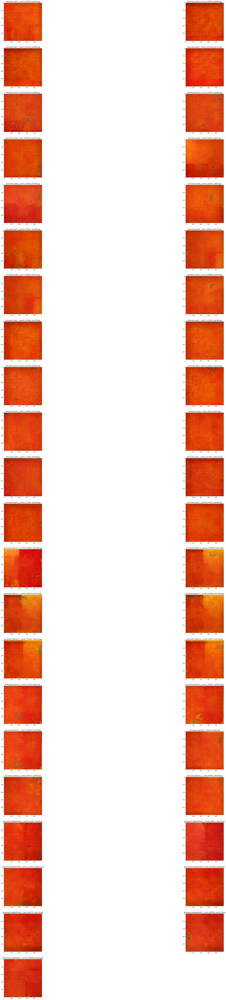

In [93]:
nuts_metadata = MetadataCatalog.get('cat_data_test')
dataset_dicts = DatasetCatalog.get("cat_data_test")
fig = plt.figure(figsize=(50,150)) 

i = 0
for d in dataset_dicts:
    i += 1
    fig.add_subplot(22, 2, i) 
    img = imread_diff(d["file_name"], cfg.INPUT.FORMAT)
    outputs = predictor(img)
    v = Visualizer(img[:, :, 0:3][:,:,::-1], metadata=nuts_metadata , scale=0.5)
    try: out = v.draw_box(outputs["instances"].pred_boxes.tensor.tolist()[0])
    except: out = v.draw_circle((0,0), radius = 0, color = "black")
    try: out = v.draw_circle((outputs["instances"].pred_keypoints.tolist())[0][0][:2:], color = "red", radius = 3)
    except: 1
    try: out = v.draw_circle((outputs["instances"].pred_keypoints.tolist())[0][1][:2:], color = "black", radius = 2)
    except: 1
    try: out = v.draw_circle((outputs["instances"].pred_keypoints.tolist())[0][2][:2:], color = "green", radius = 2)
    except: 1
    try: out = v.draw_soft_mask(np.asarray(outputs["instances"].to("cpu").pred_masks)[0,:,:], "blue",alpha = 0.3)
    except: 1
    #out = v.draw_dataset_dict(d)
    plt.title(os.path.basename(d["file_name"]))
    plt.imshow(out.get_image())
    fp = os.path.join("C:/R_projects/deep_learning_playground/detectron2/custom_data2/vid_pred", os.path.basename(d["file_name"]))
    cv2.imwrite(fp, cv2.cvtColor(out.get_image()[:,:,0:3], cv2.COLOR_BGR2RGB))
    


In [ ]:
fig = plt.figure(figsize=(20,100)) 

i = 0
for d in dataset_dicts:
    i += 1
    fig.add_subplot(10, 2, i) 
    img = imread_diff(d["file_name"], cfg.INPUT.FORMAT)
    outputs = predictor(img)
    visualizer = Visualizer(img[:, :, 0:3][:,:,::-1], metadata=nuts_metadata , scale= 0.3, instance_mode= ColorMode.IMAGE_BW)
    out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    out = visualizer.draw_dataset_dict(d)
    plt.title(d["file_name"])
    plt.imshow(out.get_image())


In [32]:
from detectron2.data import detection_utils
def imread_diff(file_name, format):
    img = detection_utils.read_image(file_name, format=format)
    img2 = detection_utils.read_image(file_name.replace(".jpg","_diff.jpg"), format=format)
    img = np.concatenate((img, img2), axis = 2)[:,:,[0,1,2,4]]
    return img


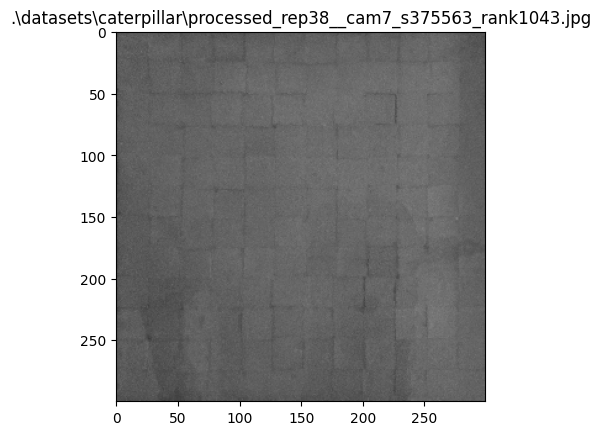

In [66]:
img = imread_diff(dataset_dicts[0]["file_name"], cfg.INPUT.FORMAT)  
outputs = predictor(img)
outputs

visualizer = Visualizer(img[:, :, 0:3][:,:,::-1], metadata=nuts_metadata , scale= 0.3, instance_mode= ColorMode.IMAGE_BW)
out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
#out = visualizer.draw_dataset_dict(d)
plt.title(d["file_name"])
plt.imshow(out.get_image())

